1) Prepare a classification model using Naive Bayes 
for salary data 

Data Description:

age -- age of a person
workclass	-- A work class is a grouping of work 
education	-- Education of an individuals	
maritalstatus -- Marital status of an individulas	
occupation	 -- occupation of an individuals
relationship -- 	
race --  Race of an Individual
sex --  Gender of an Individual
capitalgain --  profit received from the sale of an investment	
capitalloss	-- A decrease in the value of a capital asset
hoursperweek -- number of hours work per week	
native -- Native of an individual
Salary -- salary of an individual


# Read the data

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
salary_train=pd.read_csv('SalaryData_Train.csv')
salary_train

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30156,27,Private,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
30157,40,Private,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
30158,58,Private,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
30159,22,Private,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [5]:
salary_train['workclass']=pd.Categorical(salary_train['workclass'])
salary_train['workclass']=salary_train['workclass'].cat.codes

In [8]:
salary_train['education']=pd.Categorical(salary_train['education'])
salary_train['education']=salary_train['education'].cat.codes

In [9]:
salary_train['maritalstatus']=pd.Categorical(salary_train['maritalstatus'])
salary_train['maritalstatus']=salary_train['maritalstatus'].cat.codes

In [10]:
salary_train['occupation']=pd.Categorical(salary_train['occupation'])
salary_train['occupation']=salary_train['occupation'].cat.codes

In [11]:
salary_train['relationship']=pd.Categorical(salary_train['relationship'])
salary_train['relationship']=salary_train['relationship'].cat.codes

In [12]:
salary_train['race']=pd.Categorical(salary_train['race'])
salary_train['race']=salary_train['race'].cat.codes

In [13]:
salary_train['sex']=pd.Categorical(salary_train['sex'])
salary_train['sex']=salary_train['sex'].cat.codes

In [14]:
salary_train['native']=pd.Categorical(salary_train['native'])
salary_train['native']=salary_train['native'].cat.codes

In [15]:
salary_train['Salary']=pd.Categorical(salary_train['Salary'])
salary_train['Salary']=salary_train['Salary'].cat.codes

In [16]:
salary_train

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,5,9,13,4,0,1,4,1,2174,0,40,37,0
1,50,4,9,13,2,3,0,4,1,0,0,13,37,0
2,38,2,11,9,0,5,1,4,1,0,0,40,37,0
3,53,2,1,7,2,5,0,2,1,0,0,40,37,0
4,28,2,9,13,2,9,5,2,0,0,0,40,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30156,27,2,7,12,2,12,5,4,0,0,0,38,37,0
30157,40,2,11,9,2,6,0,4,1,0,0,40,37,1
30158,58,2,11,9,6,0,4,4,0,0,0,40,37,0
30159,22,2,11,9,4,0,3,4,1,0,0,20,37,0


In [17]:
salary_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30161 entries, 0 to 30160
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   age            30161 non-null  int64
 1   workclass      30161 non-null  int8 
 2   education      30161 non-null  int8 
 3   educationno    30161 non-null  int64
 4   maritalstatus  30161 non-null  int8 
 5   occupation     30161 non-null  int8 
 6   relationship   30161 non-null  int8 
 7   race           30161 non-null  int8 
 8   sex            30161 non-null  int8 
 9   capitalgain    30161 non-null  int64
 10  capitalloss    30161 non-null  int64
 11  hoursperweek   30161 non-null  int64
 12  native         30161 non-null  int8 
 13  Salary         30161 non-null  int8 
dtypes: int64(5), int8(9)
memory usage: 1.4 MB


In [18]:
salary_train[salary_train.duplicated()]

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
326,33,2,9,13,2,3,0,4,1,0,0,40,37,1
364,27,2,9,13,4,2,1,4,1,0,0,50,37,0
518,24,2,11,9,4,5,4,2,0,0,0,40,37,0
525,24,2,11,9,4,2,3,4,1,0,0,40,37,0
619,33,2,9,13,2,3,0,4,1,0,0,40,37,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30110,47,2,11,9,2,2,0,4,1,0,0,40,37,0
30118,20,2,11,9,4,6,3,4,1,0,0,40,37,0
30132,22,2,15,10,4,0,3,4,1,0,0,40,37,0
30157,40,2,11,9,2,6,0,4,1,0,0,40,37,1


In [19]:
salary_train.drop_duplicates(inplace=True)
salary_train.reset_index(drop=True,inplace=True)

In [20]:
salary_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26903 entries, 0 to 26902
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   age            26903 non-null  int64
 1   workclass      26903 non-null  int8 
 2   education      26903 non-null  int8 
 3   educationno    26903 non-null  int64
 4   maritalstatus  26903 non-null  int8 
 5   occupation     26903 non-null  int8 
 6   relationship   26903 non-null  int8 
 7   race           26903 non-null  int8 
 8   sex            26903 non-null  int8 
 9   capitalgain    26903 non-null  int64
 10  capitalloss    26903 non-null  int64
 11  hoursperweek   26903 non-null  int64
 12  native         26903 non-null  int8 
 13  Salary         26903 non-null  int8 
dtypes: int64(5), int8(9)
memory usage: 1.3 MB


In [26]:
salary_train['Salary'].value_counts()

0    20023
1     6880
Name: Salary, dtype: int64

In [28]:
salary_train.isnull().sum()

age              0
workclass        0
education        0
educationno      0
maritalstatus    0
occupation       0
relationship     0
race             0
sex              0
capitalgain      0
capitalloss      0
hoursperweek     0
native           0
Salary           0
dtype: int64

<Axes: >

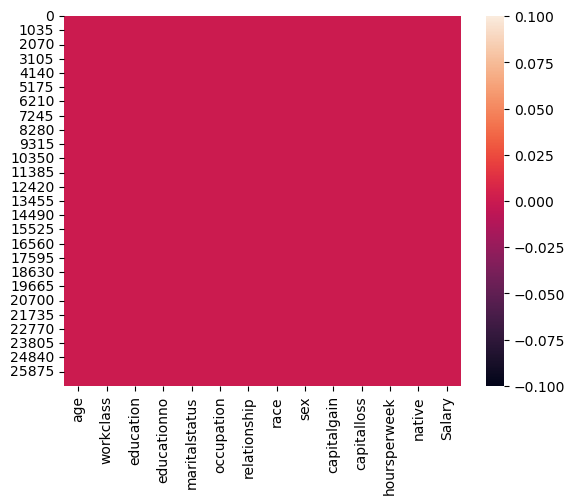

In [29]:
sns.heatmap(salary_train.isnull())

In [30]:
salary_train.corr()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
age,1.000000,0.075184,0.002717,0.038048,-0.245062,-0.004570,-0.231111,0.040457,0.070434,0.077235,0.052684,0.072529,0.010626,0.223502
workclass,0.075184,1.000000,0.021289,0.037806,-0.031961,0.014047,-0.070996,0.051479,0.079380,0.033217,0.002739,0.047169,0.012683,0.016577
education,0.002717,0.021289,1.000000,0.359940,-0.040931,-0.025890,-0.010801,0.005572,-0.029841,0.034550,0.020469,0.058709,0.076605,0.090094
educationno,0.038048,0.037806,0.359940,1.000000,-0.066536,0.084300,-0.092236,0.035215,0.010941,0.126085,0.080025,0.145491,0.096279,0.332178
maritalstatus,-0.245062,-0.031961,-0.040931,-0.066536,1.000000,0.015094,0.155553,-0.073628,-0.108928,-0.042087,-0.033890,-0.175692,-0.029585,-0.184559
occupation,-0.004570,0.014047,-0.025890,0.084300,0.015094,1.000000,-0.063950,0.008183,0.066919,0.019724,0.010873,0.023073,0.003024,0.050711
relationship,-0.231111,-0.070996,-0.010801,-0.092236,0.155553,-0.063950,1.000000,-0.113708,-0.586804,-0.063322,-0.070351,-0.248745,-0.006126,-0.247438
race,0.040457,0.051479,0.005572,0.035215,-0.073628,0.008183,-0.113708,1.000000,0.085786,0.020049,0.032111,0.056460,0.118907,0.079109
sex,0.070434,0.079380,-0.029841,0.010941,-0.108928,0.066919,-0.586804,0.085786,1.000000,0.053490,0.053084,0.228767,-0.004930,0.217360
capitalgain,0.077235,0.033217,0.034550,0.126085,-0.042087,0.019724,-0.063322,0.020049,0.053490,1.000000,-0.036023,0.079403,0.012902,0.228865


<Axes: >

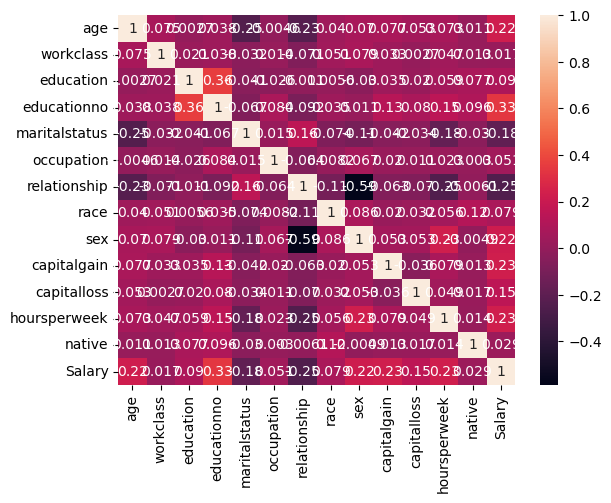

In [32]:
sns.heatmap(salary_train.corr(),annot=True)

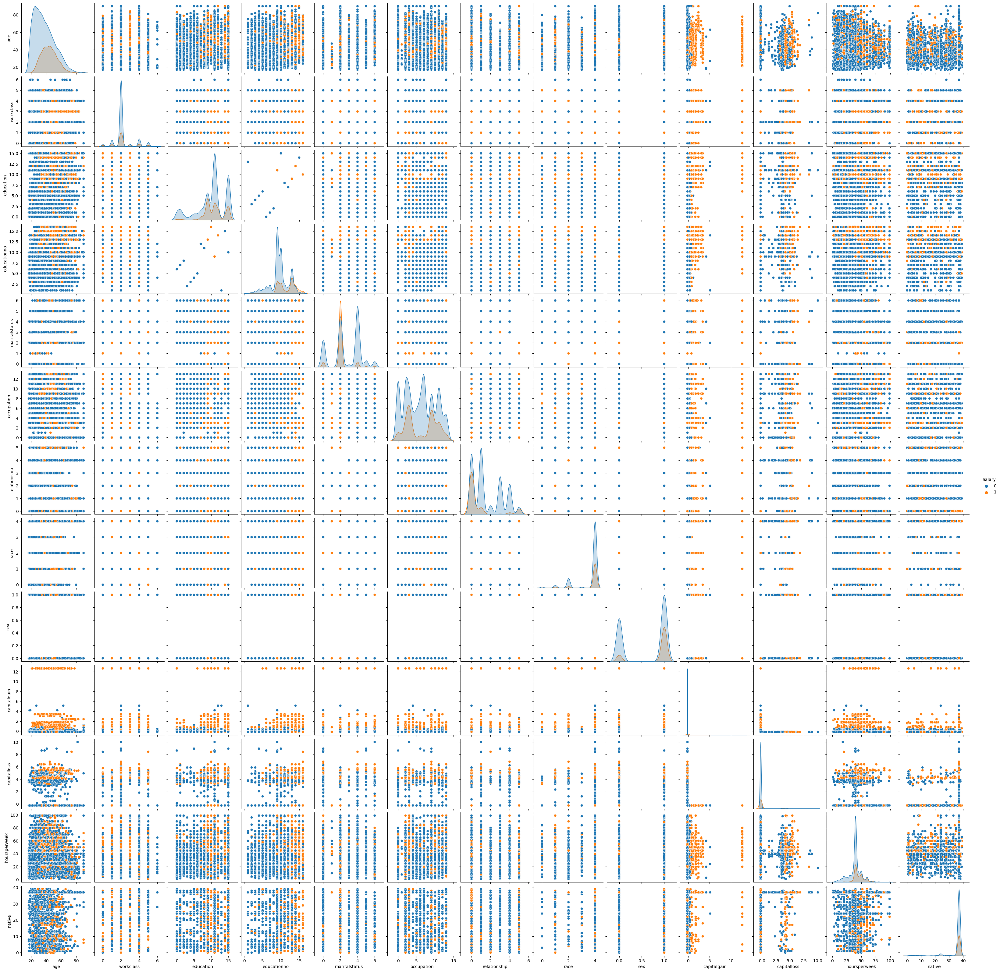

In [142]:
sns.pairplot(data=salary_train,hue='Salary')

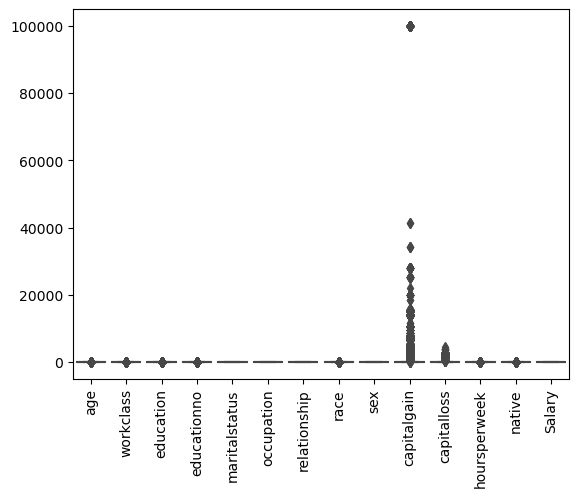

In [36]:
sns.boxplot(data=salary_train)
plt.xticks(rotation=90)
plt.show()

# count plot training data

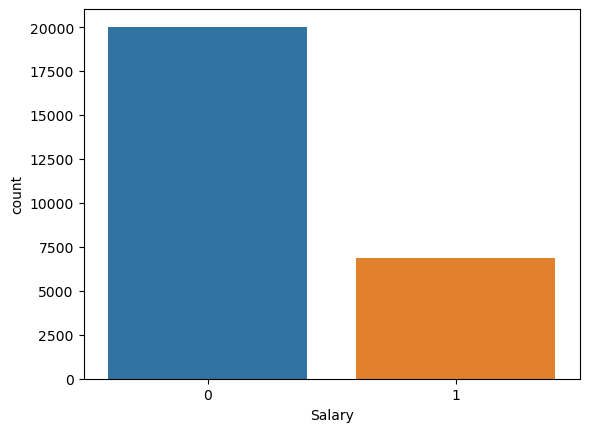

0    20023
1     6880
Name: Salary, dtype: int64

In [144]:
sns.countplot(x='Salary',data=salary_train)
plt.xlabel('Salary')
plt.ylabel('count')
plt.show()
salary_train['Salary'].value_counts()

<Axes: ylabel='education'>

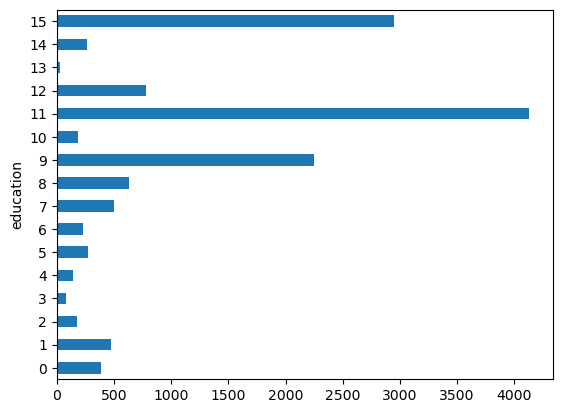

In [145]:
pd.crosstab(salary_train['Salary'],salary_train['education']).mean().plot(kind='barh')

<Axes: ylabel='educationno'>

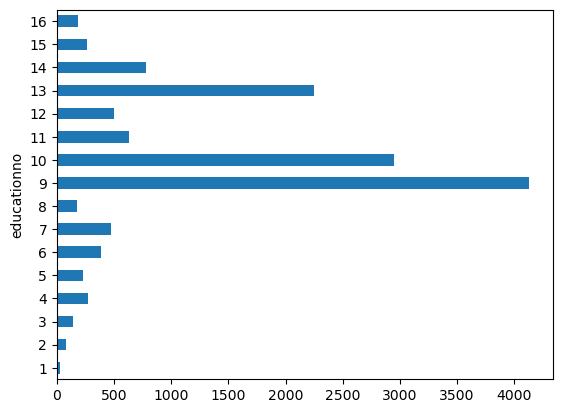

In [146]:
pd.crosstab(salary_train['Salary'],salary_train['educationno']).mean().plot(kind='barh')

<Axes: ylabel='maritalstatus'>

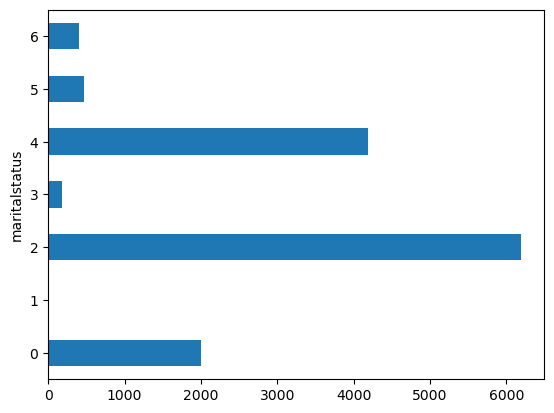

In [147]:
pd.crosstab(salary_train['Salary'],salary_train['maritalstatus']).mean().plot(kind='barh')

<Axes: ylabel='occupation'>

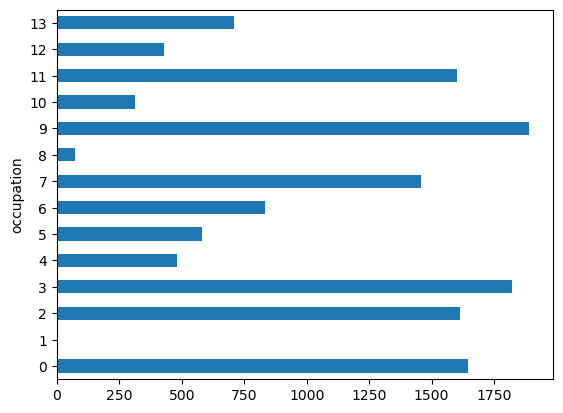

In [148]:
pd.crosstab(salary_train['Salary'],salary_train['occupation']).mean().plot(kind='barh')

<Axes: ylabel='sex'>

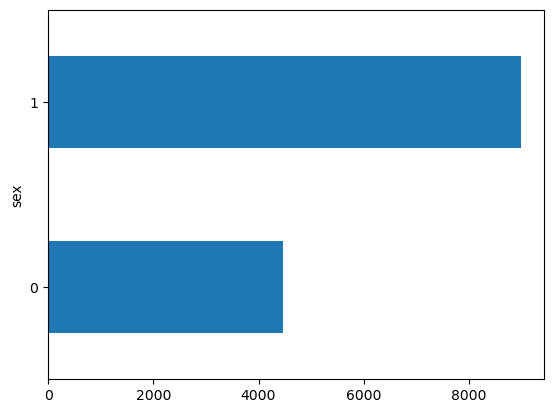

In [149]:
pd.crosstab(salary_train['Salary'],salary_train['sex']).mean().plot(kind='barh')

# scale the data

In [38]:
from sklearn.preprocessing import StandardScaler
sd_scaler=StandardScaler()

In [39]:
salary_train['capitalgain']=sd_scaler.fit_transform(salary_train['capitalgain'].values.reshape(-1,1))
salary_train['capitalloss']=sd_scaler.fit_transform(salary_train['capitalloss'].values.reshape(-1,1))

In [40]:
salary_train

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,5,9,13,4,0,1,4,1,0.122810,-0.23133,40,37,0
1,50,4,9,13,2,3,0,4,1,-0.155722,-0.23133,13,37,0
2,38,2,11,9,0,5,1,4,1,-0.155722,-0.23133,40,37,0
3,53,2,1,7,2,5,0,2,1,-0.155722,-0.23133,40,37,0
4,28,2,9,13,2,9,5,2,0,-0.155722,-0.23133,40,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26898,53,2,12,14,2,3,0,4,1,-0.155722,-0.23133,40,37,1
26899,22,2,15,10,4,10,1,4,1,-0.155722,-0.23133,40,37,0
26900,27,2,7,12,2,12,5,4,0,-0.155722,-0.23133,38,37,0
26901,58,2,11,9,6,0,4,4,0,-0.155722,-0.23133,40,37,0


In [41]:
salary_test=pd.read_csv('SalaryData_Test.csv')
salary_test

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,Private,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,34,Private,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15055,33,Private,Bachelors,13,Never-married,Prof-specialty,Own-child,White,Male,0,0,40,United-States,<=50K
15056,39,Private,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0,0,36,United-States,<=50K
15057,38,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States,<=50K
15058,44,Private,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455,0,40,United-States,<=50K


In [44]:
salary_test['workclass']=pd.Categorical(salary_test['workclass'])
salary_test['workclass']=salary_test['workclass'].cat.codes

In [45]:
salary_test['education']=pd.Categorical(salary_test['education'])
salary_test['education']=salary_test['education'].cat.codes

In [46]:
salary_test['maritalstatus']=pd.Categorical(salary_test['maritalstatus'])
salary_test['maritalstatus']=salary_test['maritalstatus'].cat.codes

In [47]:
salary_test['occupation']=pd.Categorical(salary_test['occupation'])
salary_test['occupation']=salary_test['occupation'].cat.codes

In [48]:
salary_test['relationship']=pd.Categorical(salary_test['relationship'])
salary_test['relationship']=salary_test['relationship'].cat.codes

In [49]:
salary_test['race']=pd.Categorical(salary_test['race'])
salary_test['race']=salary_test['race'].cat.codes

In [50]:
salary_test['sex']=pd.Categorical(salary_test['sex'])
salary_test['sex']=salary_test['sex'].cat.codes

In [51]:
salary_test['native']=pd.Categorical(salary_test['native'])
salary_test['native']=salary_test['native'].cat.codes

In [52]:
salary_test['Salary']=pd.Categorical(salary_test['Salary'])
salary_test['Salary']=salary_test['Salary'].cat.codes

In [53]:
salary_test[salary_test.duplicated()]

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
551,59,2,11,9,0,7,1,4,0,0,0,40,37,0
601,32,2,11,9,2,11,0,4,1,0,0,40,37,0
681,40,2,11,9,2,2,0,4,1,0,0,40,37,0
799,24,2,9,13,4,9,1,4,1,0,0,35,37,0
1044,44,2,14,15,2,9,0,4,1,99999,0,60,37,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15043,51,2,11,9,2,2,0,4,1,0,0,40,37,0
15044,22,2,15,10,4,2,3,4,1,0,0,40,37,0
15049,32,2,11,9,2,5,0,4,1,0,0,40,37,0
15052,31,2,11,9,2,2,0,4,1,0,0,40,37,0


In [54]:
salary_test.drop_duplicates(inplace=True)
salary_test.reset_index(drop=True,inplace=True)

In [55]:
salary_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14130 entries, 0 to 14129
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   age            14130 non-null  int64
 1   workclass      14130 non-null  int8 
 2   education      14130 non-null  int8 
 3   educationno    14130 non-null  int64
 4   maritalstatus  14130 non-null  int8 
 5   occupation     14130 non-null  int8 
 6   relationship   14130 non-null  int8 
 7   race           14130 non-null  int8 
 8   sex            14130 non-null  int8 
 9   capitalgain    14130 non-null  int64
 10  capitalloss    14130 non-null  int64
 11  hoursperweek   14130 non-null  int64
 12  native         14130 non-null  int8 
 13  Salary         14130 non-null  int8 
dtypes: int64(5), int8(9)
memory usage: 676.3 KB


In [56]:
salary_test.isnull().sum()

age              0
workclass        0
education        0
educationno      0
maritalstatus    0
occupation       0
relationship     0
race             0
sex              0
capitalgain      0
capitalloss      0
hoursperweek     0
native           0
Salary           0
dtype: int64

<Axes: >

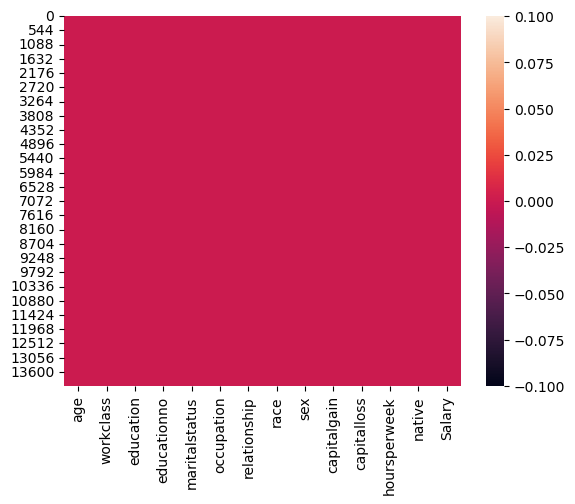

In [57]:
sns.heatmap(salary_test.isnull())

In [58]:
salary_test.corr()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
age,1.000000,0.092686,-0.004167,0.021979,-0.245822,-0.003881,-0.241180,0.035180,0.075150,0.076765,0.053172,0.088090,0.001787,0.216703
workclass,0.092686,1.000000,0.021149,0.047708,-0.030821,0.020147,-0.063257,0.064707,0.062290,0.031858,0.007808,0.051189,-0.000432,0.011495
education,-0.004167,0.021149,1.000000,0.361666,-0.044471,-0.017227,-0.013293,0.007635,-0.027574,0.030424,0.024271,0.064155,0.075685,0.092476
educationno,0.021979,0.047708,0.361666,1.000000,-0.070693,0.093437,-0.080444,0.030924,0.000603,0.132346,0.085651,0.127779,0.099699,0.326777
maritalstatus,-0.245822,-0.030821,-0.044471,-0.070693,1.000000,-0.001040,0.172341,-0.076084,-0.114448,-0.042549,-0.033647,-0.165199,-0.017963,-0.185870
occupation,-0.003881,0.020147,-0.017227,0.093437,-0.001040,1.000000,-0.054695,0.004326,0.050982,0.011623,0.012946,0.014548,0.003006,0.046633
relationship,-0.241180,-0.063257,-0.013293,-0.080444,0.172341,-0.054695,1.000000,-0.119236,-0.580247,-0.056609,-0.051241,-0.257082,0.003405,-0.254418
race,0.035180,0.064707,0.007635,0.030924,-0.076084,0.004326,-0.119236,1.000000,0.087171,0.016730,0.020725,0.041720,0.120543,0.073101
sex,0.075150,0.062290,-0.027574,0.000603,-0.114448,0.050982,-0.580247,0.087171,1.000000,0.047180,0.048382,0.227884,-0.017165,0.212100
capitalgain,0.076765,0.031858,0.030424,0.132346,-0.042549,0.011623,-0.056609,0.016730,0.047180,1.000000,-0.033929,0.089512,0.008189,0.225871


<Axes: >

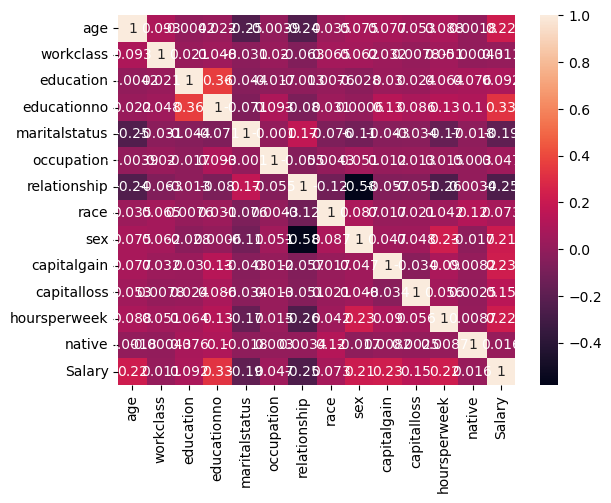

In [60]:
sns.heatmap(salary_test.corr(),annot=True)

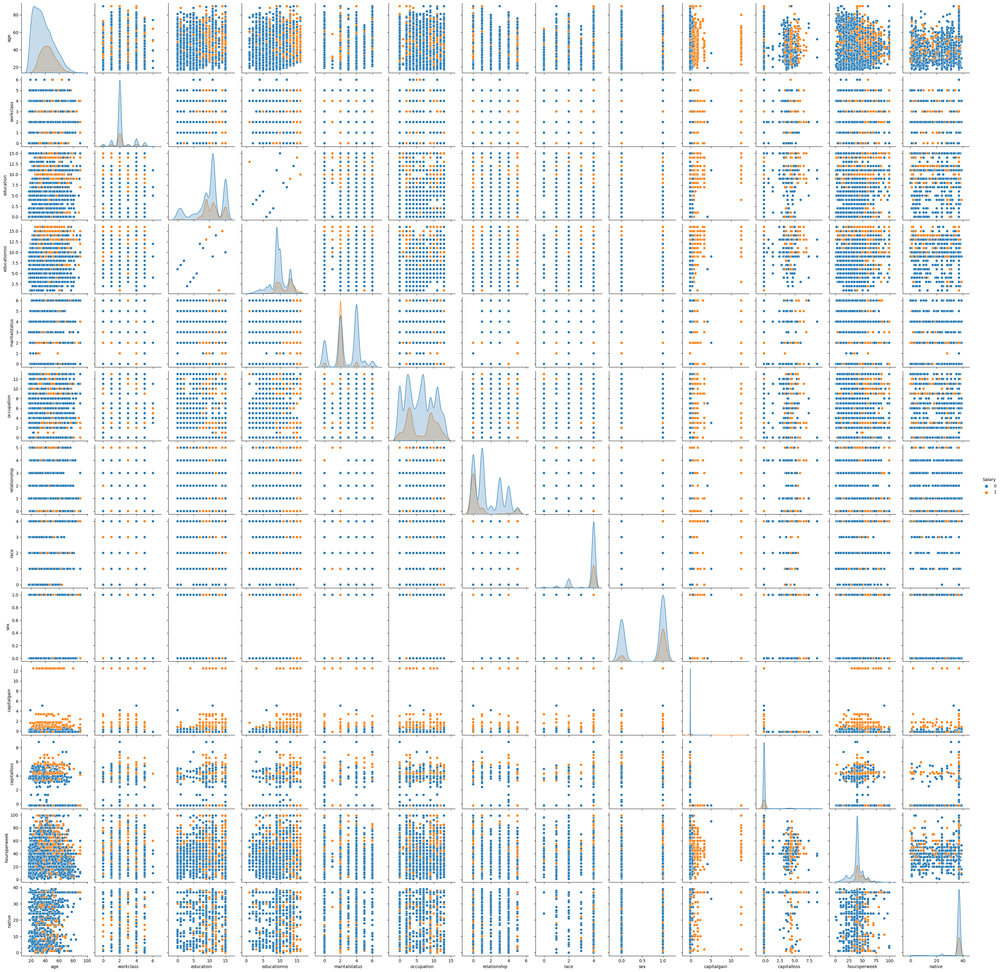

In [140]:
sns.pairplot(data=salary_test,hue='Salary')

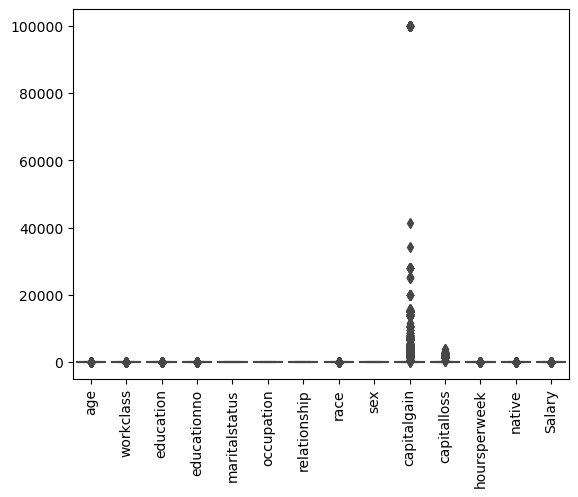

In [62]:
sns.boxplot(data=salary_test)
plt.xticks(rotation=90)
plt.show()

# count plot test data

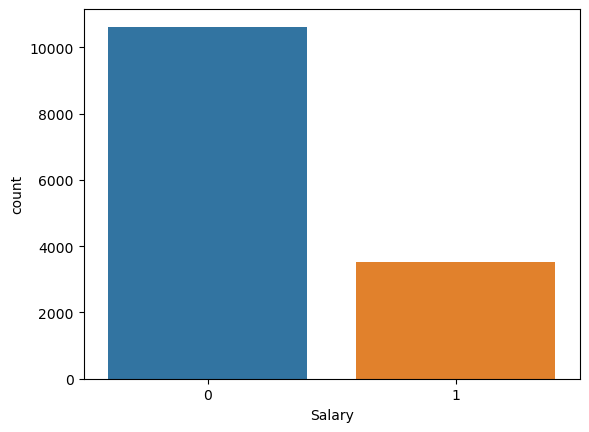

0    10620
1     3510
Name: Salary, dtype: int64

In [150]:
sns.countplot(x='Salary',data=salary_test)
plt.xlabel('Salary')
plt.ylabel('count')
plt.show()
salary_test['Salary'].value_counts()

<Axes: ylabel='education'>

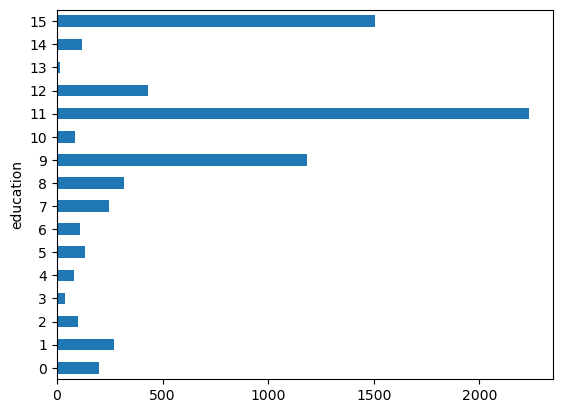

In [151]:
pd.crosstab(salary_test['Salary'],salary_test['education']).mean().plot(kind='barh')

<Axes: ylabel='educationno'>

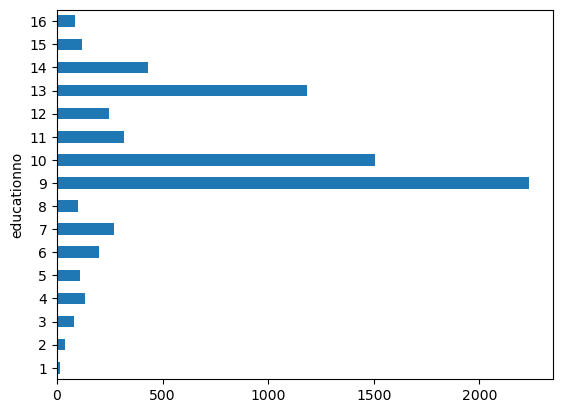

In [152]:
pd.crosstab(salary_test['Salary'],salary_test['educationno']).mean().plot(kind='barh')

<Axes: ylabel='maritalstatus'>

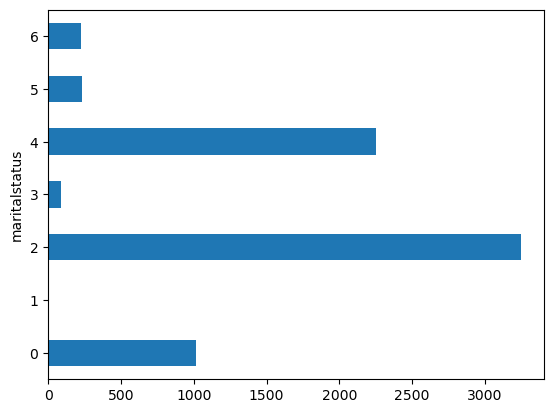

In [153]:
pd.crosstab(salary_test['Salary'],salary_test['maritalstatus']).mean().plot(kind='barh')

<Axes: ylabel='sex'>

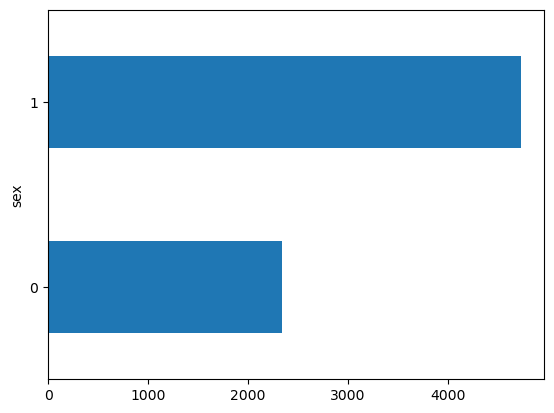

In [154]:
pd.crosstab(salary_test['Salary'],salary_test['sex']).mean().plot(kind='barh')

# scale the data

In [65]:
salary_test['capitalgain']=sd_scaler.fit_transform(salary_test['capitalgain'].values.reshape(-1,1))
salary_test['capitalloss']=sd_scaler.fit_transform(salary_test['capitalloss'].values.reshape(-1,1))

In [66]:
salary_test

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,2,1,7,4,6,3,2,1,-0.150059,-0.226108,40,37,0
1,38,2,11,9,2,4,0,4,1,-0.150059,-0.226108,50,37,0
2,28,1,7,12,2,10,0,4,1,-0.150059,-0.226108,40,37,1
3,44,2,15,10,2,6,0,2,1,0.822747,-0.226108,40,37,1
4,34,2,0,6,4,7,1,4,1,-0.150059,-0.226108,30,37,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14125,33,2,9,13,4,9,3,4,1,-0.150059,-0.226108,40,37,0
14126,39,2,9,13,0,9,1,4,0,-0.150059,-0.226108,36,37,0
14127,38,2,9,13,2,9,0,4,1,-0.150059,-0.226108,50,37,0
14128,44,2,9,13,0,0,3,1,1,0.540193,-0.226108,40,37,0


In [69]:
X_train=salary_train.iloc[:,:13]
y_train=salary_train.iloc[:,13]
X_test=salary_test.iloc[:,:13]
y_test=salary_test.iloc[:,13]
                          

In [70]:
from imblearn.over_sampling import SMOTE

In [73]:
smote=SMOTE(sampling_strategy='auto')
X_train,y_train=smote.fit_resample(X_train,y_train)
X_test,y_test=smote.fit_resample(X_test,y_test)

# build the pipe line

In [91]:
from sklearn.pipeline import Pipeline
from sklearn .decomposition import PCA
from sklearn.naive_bayes import GaussianNB
text_ppl=Pipeline([('pca',PCA()),
                  ('naivebayes',GaussianNB())
                  ])
text_ppl.fit(X_train,y_train)

Pipeline(steps=[('pca', PCA()), ('naivebayes', GaussianNB())])

# Test training  data classifier and display results

In [120]:
# Form a prediction set
predictions = text_ppl.predict(X_train)

In [121]:
predictions

array([0, 0, 0, ..., 1, 1, 1], dtype=int8)

# Report the confusion matrix

In [123]:
from sklearn.metrics import confusion_matrix, classification_report,roc_auc_score,roc_curve

In [124]:
confusion_matrix(y_train,predictions)

array([[19579,   444],
       [ 1219, 18804]], dtype=int64)

In [125]:
print(classification_report(y_train,predictions))

              precision    recall  f1-score   support

           0       0.94      0.98      0.96     20023
           1       0.98      0.94      0.96     20023

    accuracy                           0.96     40046
   macro avg       0.96      0.96      0.96     40046
weighted avg       0.96      0.96      0.96     40046



In [126]:
#the output probabilities
train_proba=text_ppl.predict_proba(X_train)
train_proba

array([[9.99229555e-01, 7.70445159e-04],
       [9.99186498e-01, 8.13502046e-04],
       [9.99924395e-01, 7.56045015e-05],
       ...,
       [3.55544848e-02, 9.64445515e-01],
       [2.46890357e-04, 9.99753110e-01],
       [1.75489933e-02, 9.82451007e-01]])

In [127]:
train_proba[:,1]

array([7.70445159e-04, 8.13502046e-04, 7.56045015e-05, ...,
       9.64445515e-01, 9.99753110e-01, 9.82451007e-01])

In [128]:
#false positive rate,true possitive rate,threshold 
fpr,tpr,thresh=roc_curve(y_train,train_proba[:,1])


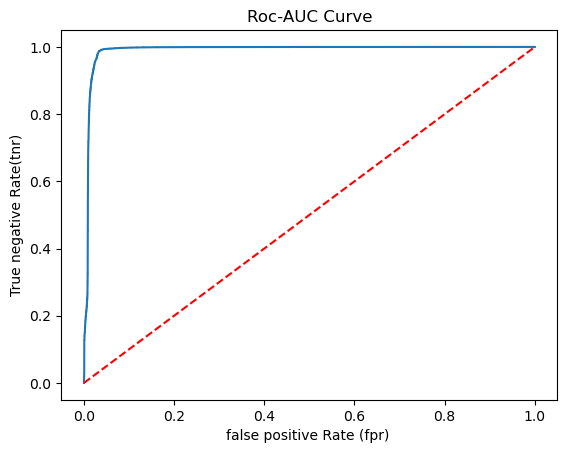

In [129]:
plt.plot(fpr,tpr)
plt.plot([0,1],[0,1],'r--')
plt.title('Roc-AUC Curve')
plt.xlabel('false positive Rate (fpr) ')
plt.ylabel('True negative Rate(tnr)')
plt.show()

In [130]:
roc_auc_score(y_train,predictions)

0.9584727563302204

# Test testing  data classifier and display results

In [99]:
# Form a prediction set
predictions = text_ppl.predict(X_test)

In [100]:
predictions

array([0, 0, 1, ..., 1, 1, 1], dtype=int8)

# Report the confusion matrix

In [102]:
from sklearn.metrics import confusion_matrix, classification_report,roc_auc_score,roc_curve

In [103]:
confusion_matrix(y_test,predictions)

array([[10363,   257],
       [  723,  9897]], dtype=int64)

In [104]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.93      0.98      0.95     10620
           1       0.97      0.93      0.95     10620

    accuracy                           0.95     21240
   macro avg       0.95      0.95      0.95     21240
weighted avg       0.95      0.95      0.95     21240



In [109]:
#the output probabilities
test_proba=text_ppl.predict_proba(X_test)
test_proba

array([[9.99821034e-001, 1.78966313e-004],
       [9.98769884e-001, 1.23011573e-003],
       [2.57202607e-002, 9.74279739e-001],
       ...,
       [6.56933793e-002, 9.34306621e-001],
       [1.37638678e-002, 9.86236132e-001],
       [1.07726391e-269, 1.00000000e+000]])

In [110]:
test_proba[:,1]

array([1.78966313e-04, 1.23011573e-03, 9.74279739e-01, ...,
       9.34306621e-01, 9.86236132e-01, 1.00000000e+00])

In [111]:
#false positive rate,true possitive rate,threshold 
fpr,tpr,thresh=roc_curve(y_test,test_proba[:,1])

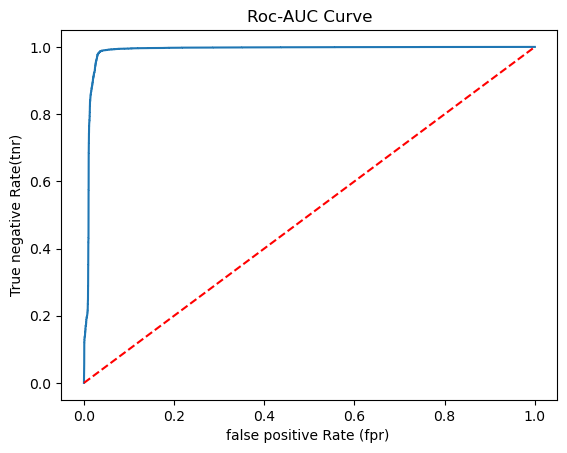

In [112]:
plt.plot(fpr,tpr)
plt.plot([0,1],[0,1],'r--')
plt.title('Roc-AUC Curve')
plt.xlabel('false positive Rate (fpr) ')
plt.ylabel('True negative Rate(tnr)')
plt.show()

In [113]:
roc_auc_score(y_test,predictions)

0.9538606403013182

# visualize the training data

In [132]:
from sklearn.manifold import TSNE

In [133]:
model=TSNE(n_components=2)

In [134]:
tsne_comp=model.fit_transform(X_train)
tsne_comp

array([[   1.0270666,   11.39872  ],
       [ -31.836329 , -105.55702  ],
       [ -73.53359  ,  -11.5469055],
       ...,
       [ -52.30619  ,  -60.91006  ],
       [  -4.9294653,  -87.03359  ],
       [  75.64076  ,   22.285267 ]], dtype=float32)

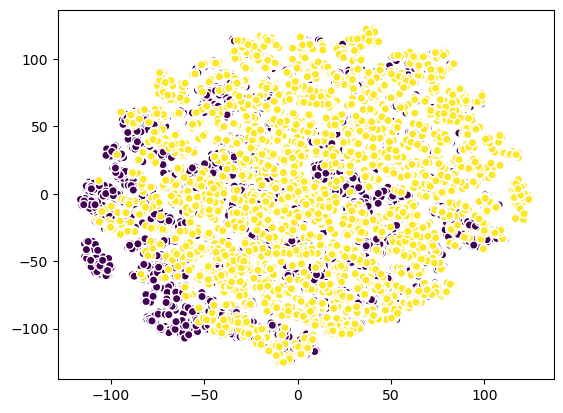

In [136]:
plt.scatter(tsne_comp[:,0],tsne_comp[:,1] ,c=y_train,cmap='viridis',edgecolors='white')
plt.show()

# #visualize the testing  data

In [138]:
tsne_comp=model.fit_transform(X_test)
tsne_comp

array([[-42.054085,  40.917835],
       [ -7.803002,  49.51599 ],
       [-59.552624, -64.28707 ],
       ...,
       [-16.28008 ,  35.948395],
       [ 51.497578,  33.963245],
       [108.484085,   9.811019]], dtype=float32)

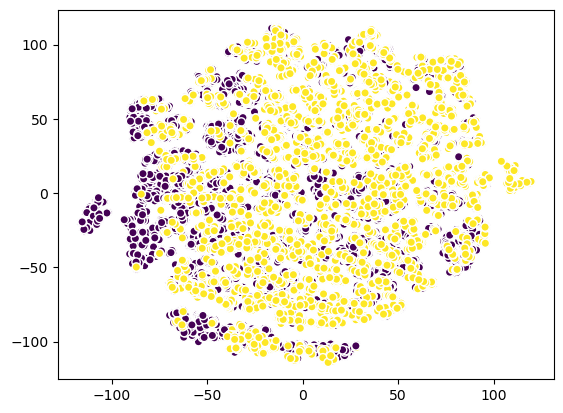

In [139]:
plt.scatter(tsne_comp[:,0],tsne_comp[:,1] ,c=y_test,cmap='viridis',edgecolors='white')
plt.show()